# ForexFlaggr

ForexFlaggr is a minimal package to pull and analyze financial (forex) data. The objective is to make informed decisions about when to exchange currencies when traveling.

Forexflaggr does not provide any financial advice.


---
```
: 18.11.23
: zach wolpe
: zach.wolpe@mlxgo.com
```
---

## Installation


Install the latest version of forexflaggr with pip:

```bash
pip install forexflaggr
```

or directly from the source code:

```bash
pip install git+https://github.com/ZachWolpe/forexflaggr.git
```

If the API fails to return data unexpectedly, it may be due to the _yahoo finance_ cache. Empty the cache with:

```bash
pip install yfinance --upgrade --no-cache-dir 
```

In [1]:
import forexflaggr as fxr

from pygam import LinearGAM, s, f, te
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import plotly.express as px
import pandas as pd
import numpy as np
import itertools
import warnings
warnings.filterwarnings('ignore')


    ______________________________________________________________________________________________________________________________________________
    ______________________________________________________________________________________________________________________________________________

            /$$          /$$$$$$$$                                            /$$$$$$$$ /$$                                        
          /$$$$$$       | $$_____/                                           | $$_____/| $$                                        
         /$$__  $$      | $$     /$$$$$$   /$$$$$$   /$$$$$$  /$$   /$$      | $$      | $$  /$$$$$$   /$$$$$$   /$$$$$$   /$$$$$$ 
        | $$  \__/      | $$$$$ /$$__  $$ /$$__  $$ /$$__  $$|  $$ /$$/      | $$$$$   | $$ |____  $$ /$$__  $$ /$$__  $$ /$$__  $$
        |  $$$$$$       | $$__/| $$  \ $$| $$  \__/| $$$$$$$$ \  $$$$/       | $$__/   | $$  /$$$$$$$| $$  \ $$| $$  \ $$| $$  \__/
         \____  $$      | $$   | $$  | $$| $

----
# Fetch Data
---

Fetch $500$ days of

- USD/ZAR data ($USDZAR=X$).
- 13 week US Treasury Bills data ($\^IRX$).


Plot the data & (weighted) moving averages. Save the plots to `/output/<plot-name>.html`



In [2]:
# Parameters ----------------------------------------------------------->>
_n_days     = 500
_MA_periods = int(12*14) # 2 weeks (1 sample/hour * 14 days)
# Parameters ----------------------------------------------------------->>

# USDZAR
ff = fxr.ForexFlaggr()
ff\
    .fetch_data(stock='USDZAR=X', n_days=_n_days)\
    .plot_signal(MA_periods=_MA_periods)
ff.fig.show()

# USTreasury Bills
fi = fxr.ForexFlaggr()
fi\
    .fetch_data(stock='^IRX', n_days=_n_days)\
    .plot_signal(MA_periods=_MA_periods)
fi.fig.show()

# S&P500
fs = fxr.ForexFlaggr()
fs\
    .fetch_data(stock='^GSPC', n_days=_n_days)\
    .plot_signal(MA_periods=_MA_periods)
fs.fig.show()

[*********************100%%**********************]  1 of 1 completed


/Users/zachwolpe/miniforge3/envs/forexflaggr/lib/python3.12/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




[*********************100%%**********************]  1 of 1 completed


/Users/zachwolpe/miniforge3/envs/forexflaggr/lib/python3.12/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




[*********************100%%**********************]  1 of 1 completed


/Users/zachwolpe/miniforge3/envs/forexflaggr/lib/python3.12/site-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




In [ ]:

# save plots as html
ff.fig.write_html("output/plots/usdzar.html")
fi.fig.write_html("output/plots/UStreasury.html")
fs.fig.write_html("output/plots/sp500.html")

# save plots as jpeg
# ff.fig.write_image("output/plots/usdzar.jpeg")
# fi.fig.write_image("output/plots/UStreasury.jpeg")
# fs.fig.write_image("output/plots/sp500.jpeg")


---
# Most Recent Price
---

In [4]:
_datetime, _timezone, _close, _open, _high, _low = fxr.get_price(ff)
_datetime, _timezone, _close, _open, _high, _low

AttributeError: module 'forexflaggr' has no attribute 'get_price'

---
# Price Momentum
---

First we wish to use the assets momentum to determine when to buy and sell.

Examining the assets movement with respect to it's (weighted) moving average can indicate whether or not it's due a correction.

We graph of (weighted) moving average above, but also look at the percentage of times $\_n\_samples$ the asset has been above and below the moving average.

Remember: there is 1 sample per hour, excluding weekends, thus $\_n\_samples=252$ equates to a $3$ week period.



In [14]:

_n_samples = 252
pcr_fig = fxr.pie_chart_recommendation.plot_pie_recommendation(ff.df_all, n_samples=_n_samples, fig=go.Figure())
pcr_fig.write_html("output/plots/pie_chart_recommendation.html")
pcr_fig.show()

----
# Model Data: GAMs + LOESS
----

If you prefer more statistical measures, consider fitting a model the the data:


- GAMs: General Additive Models
- LOESS model


**Build**

Models are built from a common stochastic model interface API.


##### Useful links

To better understand these models, here are some useful tutorials:

- https://www.projectpro.io/article/how-to-build-arima-model-in-python/544#mcetoc_1fp23v670h
- https://www.projectpro.io/article/how-to-build-arima-model-in-python/544
- https://pygam.readthedocs.io/en/latest/notebooks/tour_of_pygam.html
- https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/


In [16]:
# extract data
model_data  = ff.data.reset_index()
X, y        = np.array(model_data.index), np.array(model_data.Close)

# build LOESS model
loess_model = fxr.LOESS_Model(X, y)
loess_model\
    .build()\
    .plot_prediction()\
    .fig.show()

[2023-11-24 14:31:27.054664] <fit> finished in             0:00:17.692627.
[2023-11-24 14:31:30.772584] <transform> finished in       0:00:03.717585.
[2023-11-24 14:31:30.772702] <build> finished in           0:00:21.410783.
[2023-11-24 14:31:30.800973] <plot_prediction> finished in 0:00:00.028243.


In [17]:
# extract data
model_data  = ff.data.reset_index()
X,y         = list(model_data.index), model_data.Close
X,y         = np.reshape(X, (-1, 1)), np.reshape(y.values, (-1, 1))


# build GAM model
gam = fxr.GAM_Model(X, y)
gam.build()
# gam.plot_prediction()

# gam\
#     .build()\
#     .plot_prediction()\
#     .fig.show()

  0% (0 of 11) |                         | Elapsed Time: 0:00:00 ETA:  --:--:--
  9% (1 of 11) |##                       | Elapsed Time: 0:00:00 ETA:   0:00:02
 18% (2 of 11) |####                     | Elapsed Time: 0:00:00 ETA:   0:00:01
 27% (3 of 11) |######                   | Elapsed Time: 0:00:00 ETA:   0:00:01
 36% (4 of 11) |#########                | Elapsed Time: 0:00:00 ETA:   0:00:00
 45% (5 of 11) |###########              | Elapsed Time: 0:00:00 ETA:   0:00:00
 54% (6 of 11) |#############            | Elapsed Time: 0:00:00 ETA:   0:00:00
 63% (7 of 11) |###############          | Elapsed Time: 0:00:00 ETA:   0:00:00
 72% (8 of 11) |##################       | Elapsed Time: 0:00:01 ETA:   0:00:00
 90% (10 of 11) |#####################   | Elapsed Time: 0:00:01 ETA:   0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:01 Time:  0:00:01


[2023-11-24 14:32:46.309555] <fit> finished in             0:00:01.202727.
[2023-11-24 14:32:46.317402] <transform> finished in       0:00:00.007787.
[2023-11-24 14:32:46.319230] <extrapolate> finished in     0:00:00.001808.


[2023-11-24 14:32:46.348177] <plot_prediction> finished in 0:00:00.028923.
[2023-11-24 14:32:46.348212] <build> finished in           0:00:01.241411.


---
# More Complex Models
---

We can build a dataset of various datasources to build a more complex model.

Here we:

1. Overage daily samples so that we have a consistent sampling frequency per data source.
2. Plot `USD/ZAR` data in a 3D plane, where the
    - `x-axis = Date`
    - `y-axis = USD/ZAR`
    - `z-axis = 13 week US Treasury Bills`
    - `color = S&P500`
3. Build multidimensional models to predict the `USD/ZAR` price.
4. Examine the model and plot confidence intervals across each dimension.
5. Make Prediction
6. Plot prediction vs actual
7. Plot a larger prediction plane to assess the model smoothness.
8. Plot the actual data over the prediction plane.

In [37]:
# 1. build dataframe
def transform_df(ff, col_name='USDZAR'):
    df = ff.df_all.copy()
    df.index = df.index.strftime('%Y-%m-%d').copy()
    df = df.groupby(df.index).mean()
    df = df[['Close']]
    df.columns = [col_name]
    return df

df = transform_df(ff, 'USDZAR').join(transform_df(fi, 'USTBills')).join(transform_df(fs, 'S&P500')).reset_index()

In [42]:
# 2. plot 3d scatter plot
fig = px.scatter_3d(df, x='Datetime', y='USTBills', z='USDZAR', color='S&P500')
fig.update_layout(template='plotly_dark', title='USDZAR ~ (USTreasury, S&P500)')
fig.show()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     29.9715
Link Function:                     IdentityLink Log Likelihood:                                 -2921.2743
Number of Samples:                          346 AIC:                                             5904.4917
                                                AICc:                                            5910.7982
                                                GCV:                                                0.0506
                                                Scale:                                              0.0428
                                                Pseudo R-Squared:                                   0.9377
Feature Function                  Lam

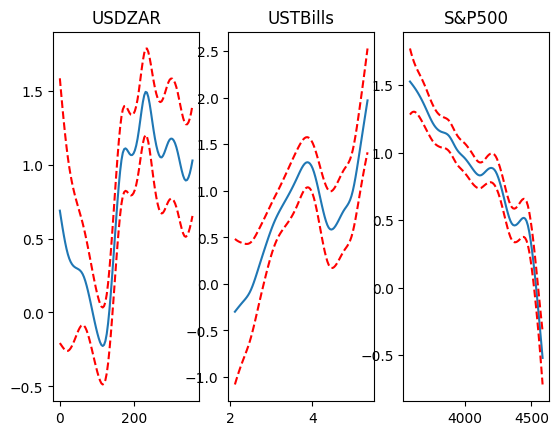

In [48]:
# 3. fit gam: note use index in place of date as a numeric
df = df.dropna()
gam = LinearGAM(s(0) + s(1) + s(2)).fit(df.reset_index()[['index', 'USTBills', 'S&P500']], df['USDZAR'])
gam.summary()

# 4. plot gam
fig, axs = plt.subplots(1,3)
titles = ['USDZAR', 'USTBills', 'S&P500']
for i, ax in enumerate(axs):
    XX = gam.generate_X_grid(term=i)
    pdep, confi = gam.partial_dependence(term=i, width=.95)
    ax.plot(XX[:, i], pdep)
    ax.plot(XX[:, i], confi, c='r', ls='--')
    ax.set_title(titles[i])

In [58]:
# 5. Make Prediction
def gam_prediction(gam=gam, df=df):
    df          = df.copy()
    yhat        = gam.predict(df.reset_index()[['index', 'USTBills', 'S&P500']])
    df['yhat']  = yhat
    return df

df2 = gam_prediction()
df2.head()

,Datetime,USDZAR,USTBills,S&P500,yhat
0,2022-07-12,16.997165,2.113000,3828.166748,17.007124
1,2022-07-13,16.961375,2.219571,3805.112863,17.063111
2,2022-07-14,17.093299,2.307857,3767.722866,17.137350
3,2022-07-15,17.132623,2.244000,3855.135672,17.021734
4,2022-07-18,17.074084,2.276143,3867.352853,17.016582


In [60]:
# 6. Plot prediction vs actual: create df
df_plot             = df.copy()
df_plot['source']   = 'actual'
df_plot2            = df2.copy()
df_plot2['source']  = 'predicted'
df_plot2['USDZAR']  = df_plot2['yhat']
df_plot2            = df_plot2.drop(columns=['yhat']) 
df_plot             = pd.concat([df_plot, df_plot2], axis=0)

In [61]:
# 6. Plot prediction vs actual: build plot
fig = px.scatter_3d(df_plot, x='Datetime', y='USTBills', z='USDZAR', color='S&P500', symbol='source', color_continuous_scale='turbo')
fig.update_layout(template=None, title='USDZAR ~ (USTreasury, S&P500)')
fig.show()

In [109]:
# 7. Plot over a larger prediction plane to examine the model: build prediction space
Z = pd.DataFrame(list(itertools.product(
    df.reset_index()['index'],
    df['USTBills'].unique(),
    df['S&P500'].unique()
    )), columns=['index', 'USTBills', 'S&P500'])

In [110]:
# 7. Plot over a larger prediction plane to examine the model: 
#   take every 100 sample, to downsample the data
_Z = Z.iloc[::100, :]

# fit
yhat        = gam.predict(_Z)
_Z          = _Z.set_index('index').join(df['Datetime'])
_Z['yhat']  = yhat


# transform to grid
# _Z.set_index('Datetime', inplace=True)
_Z = _Z.pivot_table(index='Datetime', columns='USTBills', values='yhat')

In [125]:
# 8. plot
fig = go.Figure(data=[go.Surface(z=_Z.values, x=_Z.index, y=_Z.columns)])
fig = go.Figure(data=[
    go.Surface(z=_Z.values, x=_Z.index, y=_Z.columns),
    go.Scatter3d(x=df['Datetime'], y=df['USTBills'], z=df['USDZAR'], mode='markers',
    marker=dict(size=5, color='lightblue',line=dict(color='darkblue', width=1.5)))
    ])

# change legend header
fig.update_layout(scene = dict(
                    xaxis_title='',
                    yaxis_title='USTBills Yield',
                    zaxis_title='USDZAR',
    ),
    legend=dict(title='S&P500', yanchor="top", y=0.99, xanchor="left", x=0.01, font=dict(size=1200, color="white"))

                    )
fig.update_layout(title='USDZAR ~ (Datetime, US-TBills, S&P500)', template='plotly_dark')
fig.show()

fig.write_html("output/plots/3d_hyperplane_scatter.html")
